#[Texture Generation with Neural Cellular Automata](https://arxiv.org/abs/2105.07299)
*Alexander Mordvintsev, Eyvind Niklasson, Ettore Randazzo*

----
Noms : Grégoire Dutot (gregoire.dutot@polytechnique.edu) & Hugo Simon (hugo.simon@telecom-paris.fr)



## I - **Présentation du Papier**

### 1) <ins>Introduction<ins>

Le papier *Texture Generation with Neural Cellular Automata* de **Alexander Mordvintsev, Eyvind Niklasson, Ettore Randazzo** **[1]** présente une nouvelle technique de génération de texture par automates cellulaires. Les auteurs remarquent que les textures naturelles sont souvent issues d'interactions locales entre particules ou cellules. Suivant cela, ils proposent un modèle "biologique" de formation de textures par Automates Cellulaires neuronnaux.

Le modèle développé se base en partie sur des idées récentes en génération de textures (Gatys et al, 2015) **[2]**, consistant à utiliser certaines couchent d'un CNN préentraîné pour générer à partir d'une image de bruit une image similaire à une texture cible.

Dans le cas du papier présenté ici, au lieu d'entraîner une image directement, il s'agit d'entraîner une dynamique d'automate cellulaire neuronnal assurant la reproduction d'une texture dynamique semblable à la cible.

Cette méthode, par sa dynamique, a l'avantange de produire une grande variété de textures semblables à partir d'un seul entraînement. Cet entraînement s'avère être très léger et facilement parallélisable.

### 2) <ins>Technique utilisée<ins>

**Dynamique des Automates cellulaires**

Chaque pixel de l'image est représenté par un état $\mathbf{s} \in \mathbb{R}^k$ où les $3$ premières variables représentent ses caractéristiques RGB. Chacun de ces pixels intéragit avec ses voisins suivant l'EDP de réaction diffusion suivante : 

$$\frac{∂\mathbf{s}}{∂t} = f(\mathbf{s}, ∇_x\mathbf{s}, ∇^2_x \mathbf{s})$$

Cette équation devient dans notre cas discret : 

$$ \mathbf{s}_{t+1} - \mathbf{s}_{t} = f(\mathbf{p}_t) δ_{x, y, t}$$

où $\mathbf{p}_t = concat(\mathbf{s}_t, K_x * \mathbf{s}_t, K_y * \mathbf{s}_t, K_{lap}* \mathbf{s}_t)$ est un vecteur de "perception" récupérant l'information des pixels voisins, $ δ_{x, y, t}$ est l'indicatrice de mise à jour d'un pixel et $K_x, K_y$ et $K_{lap}$ sont des approximations discrètes du gradient et laplacien. Dans le cadre de ce papier et de notre implémentation ci-dessous, nous utiliserons les filtres de Sobel et l'approximation suivante du laplacien :
$$K_x = \begin{bmatrix}-1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1  \end{bmatrix}; \quad K_y = K_x^T ;\quad K_{lap} = \begin{bmatrix}1 & 2 & 1 \\ 2 & -12 & 2 \\ 1 & 2 & 1 \end{bmatrix}$$

La fonction de mise à jour $f$ est quant à elle apprise par optimisation.

Nous nous concentrerons sur le cas asynchrone où $δ_{x, y, t}$ est choisi suivant une loi de Bernouilli de probabilité 0.5.

**Des Automates cellulaires <ins>neuronaux<ins>**

Remarquons d'abord que la fonction de mise à jour $f$ est indépendante du vecteur de perception $\mathbf{p}$. Cela permettra de transférer les relations apprises par $f$ à des topologies de dépendances différentes (en modifiant les noyaux de gradient et laplacien par exemple).

Ici, $f = relu(\mathbf{p}W_0 + b_0)W_1 + b_1$ prend la forme d'un réseau de neurones. Le modèle d'automate cellulaire prend alors la forme d'un RCNN, comme le montre la Figure 1 (issue de **[1]**).



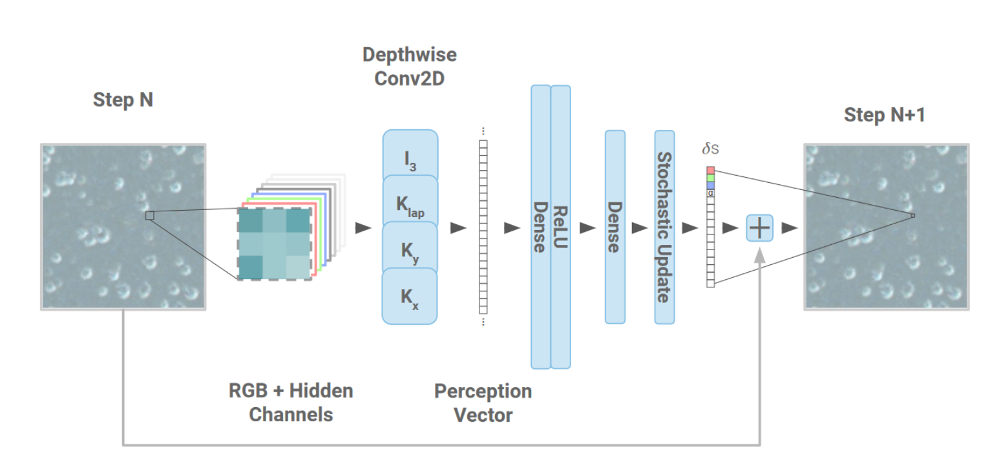


<ins>Figure 1 : Modèle d'automate cellulaire neuronal

**Loss**

Pour entraîner le NCA, une loss caractéristique de synthèse de texture **[2]** utilisant le réseau VGG est utilisée. Les canaux RGB des images produites par le NCA sont donnés à ce réseau observateur (ici VGG-16) pour récupérer les matrices de Grams des activation de certaines couches de ce réseau. Ces matrices sont ensuite comparées à celles de l'image cible, ce qui fournit une loss dérivable et permet de rétro-propager les gradients aux paramètres du NCA.

Plus concrètement, étant donné une image cible $u$ et une image d'entrée $x$, la loss s'écrit : 
$$
\mathcal{L}(x) = \sum_{\text{layers selectionnés } L} w_L\left\| G^L(x) - G^L(u) \right\|^2_F
$$
avec $\|\cdot\|_F$ la norme de Frobenius. Pour une image $y$ et une layer $L$, $G^L(y)$ représente la matrice de Gram  des features de cette couche du réseau the VGG-16 features.
Si $V^L(y)$ est la réponse de cette couche $L$ à l'image $y$, de dimension $w\times h$ et ayant $n$ canaux, 
$$
G^L(y) = \frac{1}{w h}\sum_{k\in \{0,\dots,w-1\}\times\{0,\dots,h-1\}} V^L(y)_k V^L(y)_k^T \in \mathbb{R}^{n\times n}.
$$


**Procédure d'entraînement**

Un pool de $256$ images, initialement grises, est créé. A chaque itération, 4 images de ce pool sont sélectionnées. Le modèle NCA itère alors $N \sim \mathcal{U}(32, 96)$ étapes d'entraînement sur ces 4 images avant de replacer leur évolution dans le pool. Nous conservons les gradients associés à la dernière étape d'entraînement afin de les rétro-propager.

Pour que le NCA n'oublie pas le pattern de cosntruction d'une texture au fur et à mesure de l'entraînement, les auteurs utilisent du "state checkpointing" : Toutes les 8 itérations, une de 4 images selectionnées est remplacée par une image grise.

Cette procédure d'entraînement est résumée sur la Figure 2 (issue de **[1]**).



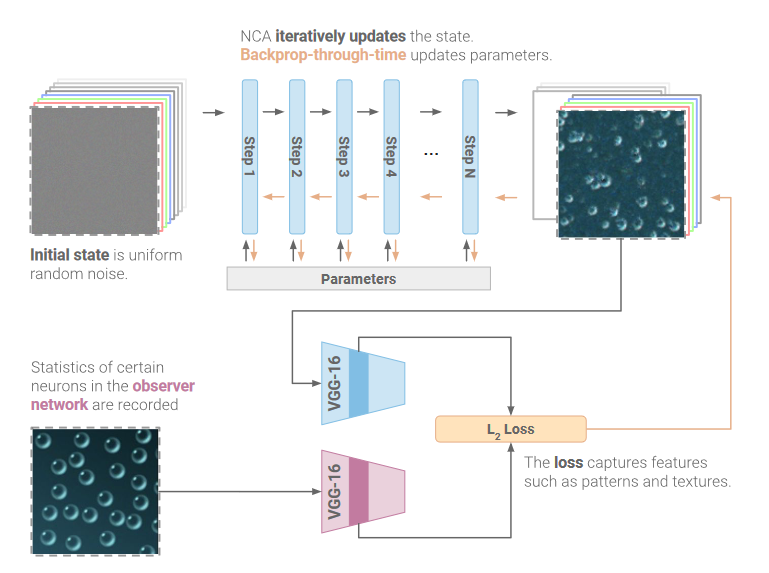

<ins>Figure 2 : Procédure d'entraînement du NCA

### 3) <ins>Nos contributions<ins>



Les auteurs fournissaient déjà une implémentation sur PyTorch très basique du NCA. Nous avons retravailler cette implémentation afin d'observer différents comportements du NCA développés le papier et modifier certains paramètres du modèle initial pour observer les effets de ces modifications. 

En particulier, ce notebook comprend :

**Partie II : Implémentation** : Une implémentation du NCA et de sa procédure d'entraînement et l'observation des caractéristiques des textures formées par les NCA.

**Partie III.1** : L'implémentation d'une rotation de la topologie de dépendance du vecteur de perception (dépendant de la place du pixel ou non). Cette rotation peut être appliqué à un NCA pleinement entraîner pour donner des textures à geométries différentes.

**Partie III.2** : La mise en apprentissage des filtres $K_x$, $K_y$ et $K_{lap}$.

**Partie III.3** : L'essai de différentes régularisations se basant sur l'image en elle-même, sa matrice de covariance ou le module de sa transformée de Fourier.



## II - **Implémentation**

### 0) *Utilities*

Les fonctions de cette partie sont utilisés pour visualiser et traiter les données d'images. Nous installons aussi le CNN VGG-16 que nous utilison pour calculer notre texture loss.

In [ ]:

%tensorflow_version 2.x

import os
import io
import PIL.Image, PIL.ImageDraw
import base64
import zipfile
import json
import requests
import numpy as np
import matplotlib.pylab as plt
import glob

from IPython.display import Image, HTML, clear_output
from tqdm import tqdm_notebook, tnrange

os.environ['FFMPEG_BINARY'] = 'ffmpeg'
import moviepy.editor as mvp
from moviepy.video.io.ffmpeg_writer import FFMPEG_VideoWriter
import torch
import torchvision.models as models
from torch.nn.functional import mse_loss

def imread(url, max_size=None, mode=None):
  if url.startswith(('http:', 'https:')):
    # wikimedia requires a user agent
    headers = {
      "User-Agent": "Requests in Colab/0.0 (https://colab.research.google.com/; no-reply@google.com) requests/0.0"
    }
    r = requests.get(url, headers=headers)
    f = io.BytesIO(r.content)
  else:
    f = url
  img = PIL.Image.open(f)
  if max_size is not None:
    img.thumbnail((max_size, max_size), PIL.Image.ANTIALIAS)
  if mode is not None:
    img = img.convert(mode)
  img = np.float32(img)/255.0
  return img

def np2pil(a):
  if a.dtype in [np.float32, np.float64]:
    a = np.uint8(np.clip(a, 0, 1)*255)
  return PIL.Image.fromarray(a)

def imwrite(f, a, fmt=None):
  a = np.asarray(a)
  if isinstance(f, str):
    fmt = f.rsplit('.', 1)[-1].lower()
    if fmt == 'jpg':
      fmt = 'jpeg'
    f = open(f, 'wb')
  np2pil(a).save(f, fmt, quality=95)

def imencode(a, fmt='jpeg'):
  a = np.asarray(a)
  if len(a.shape) == 3 and a.shape[-1] == 4:
    fmt = 'png'
  f = io.BytesIO()
  imwrite(f, a, fmt)
  return f.getvalue()

def im2url(a, fmt='jpeg'):
  encoded = imencode(a, fmt)
  base64_byte_string = base64.b64encode(encoded).decode('ascii')
  return 'data:image/' + fmt.upper() + ';base64,' + base64_byte_string

def imshow(a, fmt='jpeg'):
  display(Image(data=imencode(a, fmt)))

def tile2d(a, w=None):
  a = np.asarray(a)
  if w is None:
    w = int(np.ceil(np.sqrt(len(a))))
  th, tw = a.shape[1:3]
  pad = (w-len(a))%w
  a = np.pad(a, [(0, pad)]+[(0, 0)]*(a.ndim-1), 'constant')
  h = len(a)//w
  a = a.reshape([h, w]+list(a.shape[1:]))
  a = np.rollaxis(a, 2, 1).reshape([th*h, tw*w]+list(a.shape[4:]))
  return a

def zoom(img, scale=4):
  img = np.repeat(img, scale, 0)
  img = np.repeat(img, scale, 1)
  return img

class VideoWriter:
  def __init__(self, filename='_autoplay.mp4', fps=30.0, **kw):
    self.writer = None
    self.params = dict(filename=filename, fps=fps, **kw)

  def add(self, img):
    img = np.asarray(img)
    if self.writer is None:
      h, w = img.shape[:2]
      self.writer = FFMPEG_VideoWriter(size=(w, h), **self.params)
    if img.dtype in [np.float32, np.float64]:
      img = np.uint8(img.clip(0, 1)*255)
    if len(img.shape) == 2:
      img = np.repeat(img[..., None], 3, -1)
    self.writer.write_frame(img)

  def close(self):
    if self.writer:
      self.writer.close()

  def __enter__(self):
    return self

  def __exit__(self, *kw):
    self.close()
    if self.params['filename'] == '_autoplay.mp4':
      self.show()

  def show(self, **kw):
      self.close()
      fn = self.params['filename']
      display(mvp.ipython_display(fn, **kw))

!nvidia-smi -L

torch.set_default_tensor_type('torch.cuda.FloatTensor')

GPU 0: Tesla T4 (UUID: GPU-ed94970f-4898-6fd0-661b-2f1505c00bb3)


In [ ]:
#@title Visualisation functions

def vis_ca(ca, img_sz=256, rand=False):
  with VideoWriter() as vid, torch.no_grad():
    x = ca.seed(1, img_sz, rand=rand)
    for k in tnrange(300, leave=False):
      step_n = min(2**(k//30), 16)
      for i in range(step_n):
        x[:] = ca(x)
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

def vis_ca_static(ca, img_sz=256, rand=False, time_list = [0, 10, 20, 50, 1000, 5000]):
    with torch.no_grad():
      #fig, axes = plt.subplots(1, len(time_list))
      x = ca.seed(1, img_sz)
      step_n = max(time_list) + 1
      img_nb = 0
      res = torch.zeros((len(time_list), x.shape[2], x.shape[3], 3))
      for i in range(step_n):
          if i in time_list:
              res[img_nb] = to_rgb(x[0]).permute([1, 2, 0])
              img_nb += 1
          
          x[:] = ca(x)

      print(str(time_list).replace(',', ',         '))
      axes = imshow(np.hstack(res.cpu()))



In [ ]:
#@title VGG 16 download
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
cnn = models.vgg16(pretrained=True).features.to(device).eval()
cnn.requires_grad_(False)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

In [ ]:
#@title Image processing functions

def to_nchw(img):
  img = torch.as_tensor(img)
  if len(img.shape) == 3:
    img = img[None,...]
  return img.permute(0, 3, 1, 2)

def prep_img(imgs, target=False):
  if target:
    imgs = to_nchw(imgs)
  mean = torch.tensor([0.485, 0.456, 0.406])[:,None,None]
  std = torch.tensor([0.229, 0.224, 0.225])[:,None,None]
  x = (imgs-mean) / std
  return x

def to_rgb(x):
  return x[...,:3,:,:]+0.5

Nous codons dans la cellule ci-dessous les focntions permettant l'application des filtres de dérivation au vecteur de perception. La fonction `perchannel_conv` traite de l'application des filtres classique tandis que la fonction `perchannel_dynamic_conv` permet l'application de filtres dépendant de la position de chaque pixels. Ces filtres sont produits par la fonction `rotation_kernels`(Voir la partie III.1 pour plus de précision).

In [ ]:
#@title Fonctions utilitaire pour le modèle (et ses variantes)

ident = torch.tensor([[0.0,0.0,0.0],[0.0,1.0,0.0],[0.0,0.0,0.0]])
sobel_x = torch.tensor([[-1.0,0.0,1.0],[-2.0,0.0,2.0],[-1.0,0.0,1.0]])
lap = torch.tensor([[1.0,2.0,1.0],[2.0,-12,2.0],[1.0,2.0,1.0]])

def perchannel_conv(x, filters):
  '''filters: [filter_n, h, w]'''
  b, ch, h, w = x.shape
  y = x.reshape(b*ch, 1, h, w)
  
  y = torch.nn.functional.pad(y, [1, 1, 1, 1], 'circular')
  
  y = torch.nn.functional.conv2d(y, filters[:,None])
  
  return y.reshape(b, -1, h, w)

def dynamic_convolve(x, kernel, img_sz=256):
  b, ch, h, w = x.shape
  y = x.reshape(b*ch, 1, h, w)
  y = torch.nn.functional.pad(y, [1, 1, 1, 1], 'circular')
  inp_unf = torch.nn.functional.unfold(y, (3, 3))

  output = kernel.reshape((-1,img_sz*img_sz,3*3))
  out_size = list(output.size())
  out_size[0] *= inp_unf.size()[0]
  full_weights = output.expand(*out_size)

  # Reshape full_weights to the expected shape
  full_weights = full_weights.view(inp_unf.size(0), inp_unf.size(2), 1, inp_unf.size(1)).permute(0, 3, 1, 2)
  # Compute the product weight*entry in each patch
  full_out =  inp_unf.unsqueeze(-1).expand_as(full_weights) * full_weights
  # Sum over patches
  out_unf = full_out.sum(1)
  # Put chan dim at the right place
  out_unf = out_unf.transpose(1, 2)
  out = torch.nn.functional.fold(out_unf, (img_sz, img_sz), (1, 1))
  return out

def rotation_kernels(length, img_sz=256):
    rotated_kernels_x = torch.zeros((img_sz,img_sz,3,3))
    rotated_kernels_y = torch.zeros((img_sz,img_sz,3,3))
    for i in range(length):
      for j in range(length):
        i_0,j_0 = i- length//2, j-length//2 # middle
        alpha = np.arcsin(i_0 /np.sqrt(j_0**2 + i_0**2 + 1e-8)) + 0.75 +np.pi/2 # 
        c, s = np.cos(alpha), np.sin(alpha)
        rotated_kernels_x[i,j,:,:] = c * sobel_x - s*sobel_x.T
        rotated_kernels_y[i,j,:,:] = s*sobel_x + c*sobel_x.T
    return rotated_kernels_x, rotated_kernels_y 

rotated_kernels_x, rotated_kernels_y = rotation_kernels(256, 256)

def perchannel_dynamic_conv(x, filters, img_sz=256):
  b, ch, h, w = x.shape
  y = x.reshape(b*ch, 1, h, w)
  y = torch.nn.functional.pad(y, [1, 1, 1, 1], 'circular')
  y_id = torch.nn.functional.conv2d(y, filters[0,None].unsqueeze(0))
  y_lap = torch.nn.functional.conv2d(y, filters[3,None].unsqueeze(0))
  y_dx = dynamic_convolve(x, rotated_kernels_x, img_sz=img_sz)
  y_dy = dynamic_convolve(x, rotated_kernels_y, img_sz=img_sz)
  y = torch.cat([y_id, y_dx, y_dy, y_lap], dim=1)
  return y.reshape(b, -1, h, w)

def rotate(kernel_x, kernel_y, theta):
  c, s = np.cos(theta), np.sin(theta)
  n_kernel_x = c * kernel_x - s*kernel_y
  n_kernel_y = s * kernel_x + c *kernel_y 
  return n_kernel_x, n_kernel_y


###1) <ins>Le modèle<ins>

Nous définissons d'abord un modèle NCA basique ci-dessous. Ce modèle a exactement l'architecture détaillée dans la première partie de ce rapport. Avec les paramètres par défaut, ce modèle d'automate cellulaire ne possède que **5856** paramètres, ce qui est finalement assez rapide à entraîner.

In [ ]:
ident = torch.tensor([[0.0,0.0,0.0],[0.0,1.0,0.0],[0.0,0.0,0.0]])
sobel_x = torch.tensor([[-1.0,0.0,1.0],[-2.0,0.0,2.0],[-1.0,0.0,1.0]])
lap = torch.tensor([[1.0,2.0,1.0],[2.0,-12,2.0],[1.0,2.0,1.0]])

def perception(x, theta=None, dynamic=False):
  '''
  Stacks state and kernel into a perception vector
  '''
  kernel_x, kernel_y = rotate(sobel_x, sobel_x.T, theta=theta) if not(theta is None) else (sobel_x, sobel_x.T)
  filters = torch.stack([ident, kernel_x, kernel_y, lap])
  if dynamic:
    # Kernel is depending on the pixel position
    return perchannel_dynamic_conv(x, filters, img_sz=np.min(x.shape[-2:]))
  else:
    return perchannel_conv(x, filters)

class CA(torch.nn.Module):
  '''
  Simple NCA
  '''
  def __init__(self, chn=12, hidden_n=96, update_rate=0.5):
    super().__init__()
    self.chn =  chn
    self.w1 = torch.nn.Conv2d(chn*4, hidden_n, 1)
    self.w2 = torch.nn.Conv2d(hidden_n, chn, 1, bias=False)
    self.w2.weight.data.zero_()
    self.update_rate = update_rate
    self.theta=None
    self.dynamic=False

  def rotation(self, theta):
    self.theta = theta

  def go_dynamic(self, bool_=True):
    self.dynamic=bool_

  def forward(self, x):
    y = perception(x, theta=self.theta, dynamic=self.dynamic)
    y = self.w1(y)
    y = torch.relu(y)
    y = self.w2(y)
    b, c, h, w = y.shape
    udpate_mask = (torch.rand(b, 1, h, w)+self.update_rate).floor() # Which cells are updated or not
    return x+y*udpate_mask

  def seed(self, n, sz=128, rand=False):
    seed_ = torch.zeros(n, self.chn, sz, sz)    
    if rand:
      return seed_ + 0.5 * torch.rand(n, self.chn, sz, sz)
    return seed_

param_n = sum(p.numel() for p in CA().parameters())
print('CA param count:', param_n)


CA param count: 5856


Nous choisissons ensuite les layers à extraire du modèle VGG pour calculer la loss souhaitée. Les layers choisies correspondent aux sorties des fonctions d'activation à la fin de chaque "étape" de convolution. Pour conserver les activation de ces layers, nous y enregistrons un hook. La loss sera une loss définie sur les matrices de Grams, inspiré de **[2]**. Dans cette cellule sont aussi codés d'autres caractéristiques de l'image (moyenne, matrice de covariance, module de la transformée de Fourier). Ces autres caractéristiques seront utilisé pour ajouter des régularisations à la loss originale. Nous les mentionnerons sous le nom `additionnal_loss` dans la procédure d'entraînement.

In [ ]:
# select chosen layers
layers = [1, 6, 11, 18, 25]  
# Define weights for layers
layers_weights = [1e6/n**2 for n in [64,128,256,512,512]]
# Initialize outputs dic
outputs = {}

# Hook definition
def save_output(name):
    
    # The hook signature
    def hook(module, module_in, module_out):
        outputs[name] = module_out
    return hook

# Register hook on each layer with index on array "layers"
for layer in layers:
    handle = cnn[layer].register_forward_hook(save_output(layer))
    
def gramm(tnsr):
  '''
   Computes Gram matrix for the input batch tensor.
    Args: tnsr (torch.Tensor): input tensor of the Size([B, C, H, W]).
    Returns:  G (torch.Tensor): output tensor of the Size([B, C, C]).
  '''   
  b,c,h,w = tnsr.size() 
  F = tnsr.view(b, c, h*w)
  G = torch.bmm(F, F.transpose(1,2))
  G.div_(h*w)
  return G

def gram_loss(input, gramm_target, weight = 1.0):
    '''Computes MSE Loss for 2 Gram matrices '''
    loss = weight * mse_loss(gramm(input), gramm_target)
    return loss

def compute_mean_cov(tnsr):
    '''
    Computes the covariance along pixels for each image in the batch, and for each color channel
    '''
    mean = torch.mean(tnsr, axis=[2,3])
    b,c,w,h = tnsr.size()
    centered = tnsr.reshape(b, c, -1) - mean.reshape(b,c,1)
    cov = torch.bmm(centered, centered.transpose(1,2))
    return mean, cov / (w*h)
    
def compute_img_features(img):
  mean, cov = compute_mean_cov(img)
  dft = torch.fft.fftshift(torch.fft.fft2(img))
  moddft = torch.abs(dft)
  return mean, cov, moddft


Nous importons plusieurs texture différentes depuis internet. Toutes les textures présentées ci-dessous peuvent être utilisées grâce à la fonction `import_img`.

In [ ]:
#@title Images imports
dic_images = {'briques' : 'https://www.idpoisson.fr/galerne/mva/briques.png',
              'galets' : 'https://www.idpoisson.fr/galerne/mva/pebbles.jpg',
              'lignes' : 'https://www.robots.ox.ac.uk/~vgg/data/dtd/thumbs/banded/banded_0037.jpg',
              'visage' : 'https://www.robots.ox.ac.uk/~vgg/data/dtd/images/freckled/freckled_0067.jpg',
              'damier' : 'https://www.robots.ox.ac.uk/~vgg/data/dtd/images/chequered/chequered_0121.jpg',
              'bulles' : 'https://www.robots.ox.ac.uk/~vgg/data/dtd/images/bubbly/bubbly_0101.jpg',
              'degrade' : 'https://miro.medium.com/max/1400/1*-C-2QH9ILLFXtvSHYXukag.jpeg',
              'feuille' : 'https://www.robots.ox.ac.uk/~vgg/data/dtd/images/veined/veined_0106.jpg',
              'gouache' : 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/04/Tempera%2C_charcoal_and_gouache_mountain_painting_by_Nicholas_Roerich.jpg/301px-Tempera%2C_charcoal_and_gouache_mountain_painting_by_Nicholas_Roerich.jpg'
              }

print('Images available are :', list(dic_images.keys()))
def import_img(name, sz=None,prep=True):
  url = dic_images[name]
  img_target = imread(url, max_size=128)[:sz,:sz,:]
  if prep:
    imshow(img_target)
    img_target = prep_img(img_target, target=True)
    img_target = img_target.to(device)
  return img_target



Images available are : ['briques', 'galets', 'lignes', 'visage', 'damier', 'bulles', 'degrade', 'feuille', 'gouache']


Nous définissons ci-dessous la procédure d'entraînement, telle que détaillée dans l'article. Cette procédure se déroule de la manière décrite dans la partie I.2. Notons qu'ici, le pool comporte 256 images, à partir duquel nous tirons 4 images à chaque itération. Toutes les 8 itérations. Nous remplaçons une de ses images par une image vide, d'après le principe de "state-checkpointing".

On notera qu'une overflow loss est aussi rajoutée dans la procédure d'entraînement, afin de contraindre la valeur des états des pixels des images produites par l'automate cellulaire.

In [ ]:
def train(
    a,
    target_img,
    opt,
    lr_sched,
    mode='original',
    pool_size=256,
    img_sz=128,
    display=False,
    epochs=4000,
    **kwargs):
    loss_log = []

    # Style of the target img :
    cnn(target_img)
    gramm_targets = [gramm(outputs[key]) for key in layers]

    with torch.no_grad():
        pool = ca.seed(pool_size, sz=img_sz)

    if not(mode=='original'):
      # see multiple loss paragraph
      target_mean, target_cov, target_moddft = compute_img_features(target_img)

    for i in range(epochs):
      # We select images randomly in the pool
      with torch.no_grad():
        batch_idx = np.random.choice(len(pool), 4, replace=False)
        x = pool[batch_idx]
        if i%8 == 0:
          # We take a blank image
          x[:1] = ca.seed(1, sz=img_sz)
      
      # step_n passes through the CA
      step_n = 64 if 'period' in kwargs else np.random.randint(32, 96) # See test on update periodicity
      # Sequentially apply the CA to x and keep the gradients of the last update
      x = torch.utils.checkpoint.checkpoint_sequential([ca]*step_n, 16, x)

      # Modifying the image to pass it to VGG
      imgs = prep_img(to_rgb(x).permute([0, 2, 3, 1]), target=True)
      cnn(imgs)
      synth_outputs = [outputs[key] for key in layers] 
      
      if not(mode=='original'):
        input_mean, input_cov, input_moddft = compute_img_features(imgs)
      
      losses = []
      other_losses = [] # For non gramm loss, useful to tune lamnda
      for activations in zip(synth_outputs, gramm_targets, layers_weights):
    
        if mode == 'original':
            losses.append(gram_loss(*activations).unsqueeze(0))
            
        elif mode == 'color_reg':
            lbda_mean = 1e2 if 'lbda_mean' not in kwargs else kwargs['lbda_mean']
            lbda_cov = 1e2 if 'lbda_cov' not in kwargs else kwargs['lbda_cov']
            # Regarder l'impact des lambdas cov : bulles : est-ce qu'elles bougent ! etc...
            graml = gram_loss(*activations).unsqueeze(0)
            reg_loss = (lbda_mean * mse_loss(target_mean, input_mean) + lbda_cov * mse_loss(target_cov, input_cov)).unsqueeze(0)
            other_losses.append(reg_loss)
            losses.append((graml + reg_loss).unsqueeze(0))
            
        elif mode == 'fourier':
            lbda_fourier = 2 if 'lbda_fourier' not in kwargs else kwargs['lbda_fourier']
            fourier_loss = lbda_fourier * mse_loss(target_moddft, input_moddft).unsqueeze(0)
            graml = gram_loss(*activations)
            other_losses.append(fourier_loss)
            losses.append(graml + fourier_loss)

      loss = torch.cat(losses).sum()
      other_loss = torch.cat(other_losses).sum().item() if mode in ['fourier', 'color_reg'] else None
      
      # Adding an overflow loss
      overflow_loss = (x-x.clamp(-1.0, 1.0)).abs().sum()
      loss = loss + overflow_loss 
      with torch.no_grad():
        loss.backward()
        for p in ca.parameters():
          p.grad /= (p.grad.norm()+1e-8)   # We normalize gradients 
        opt.step()
        opt.zero_grad()
        lr_sched.step()
        pool[batch_idx] = x                # We update the pool
        loss_log.append(loss.item())
        if i%64==0 and display:
          clear_output(True)
          plt.plot(loss_log, '.', alpha=0.1)
          plt.yscale('log')
          plt.ylim(np.min(loss_log), loss_log[0])
          plt.ylabel('loss')
          plt.xlabel('epoch')
          plt.show()
          imgs = to_rgb(x).permute([0, 2, 3, 1]).cpu()
          imshow(np.hstack(imgs))
        if i%10 == 0:
          print('\rstep_n:', len(loss_log),
            ' loss:', loss.item(),
            ' additional loss:', other_loss,
            ' lr:', lr_sched.get_lr()[0], end='')

### 2) <ins>Cas d'utilisation<ins>

Cette partie présente quelques cas basiques d'utilisation du modèle d'automate cellulaire qui a été implémenté. L'entraîenement complet d'un modèle d'automate cellualaire dure environ 10 minutes sur Collab. Les vidéos présentés présentent le comportement d'un modèle entraîné.

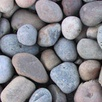

In [ ]:
target_img = import_img('galets', sz=102)


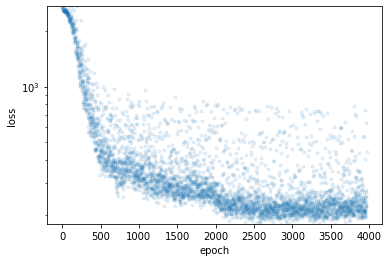

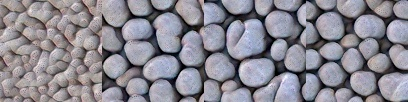

step_n: 3991  loss: 215.15045166015625  additional loss: None  lr: 0.0003

  0%|          | 0/300 [00:00<?, ?it/s]

In [ ]:
#@title a) Un simple entraînement
# Initialisation du CA
ca = CA() 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=True)
vis_ca(ca, img_sz=128)


Nous observons sur cette première simulation certaines caractéristiques des textures générées par automates cellulaires :

* Les textures générés convergent vers des textures ressemblant de manière convaincante à la texture initiale des galets.

* Chaque galet se comporte comme une entité à part entière qui se divise, se confond avec les autres ou disparaît. Nous retrouvons dans la dynamique de ces textures le comportement organique initialement souhaité par le papier.

* Les textures générées présentent une dynamique stable, ce qui permet d'avoir accès à de nombreuses textures différentes les unes des autres tout en n'ayant entaîné qu'un seul modèle.

In [ ]:
#@title b) Retrait d'un trou au milieu de l'image
l = []
restart_step = 0
restarted = 0
with VideoWriter() as vid, torch.no_grad():
  x = ca.seed(1, 256//2)
  for k in tnrange(300, leave=False):
    step_n = min(2**((k-(restarted*150))//30), 16)
    l.append(step_n)
    if k == 150:
      restarted = 1
      n_d = 64//2
      shape_ = x[:,:, 128//2-n_d:128//2+n_d, 128//2-n_d:128//2+n_d].shape
      x[:,:, 128//2-n_d:128//2+n_d, 128//2-n_d:128//2+n_d] = torch.zeros(shape_) - 0.9

    for i in range(step_n):
      x[:] = ca(x)
    img = to_rgb(x[0]).permute(1, 2, 0).cpu()
    vid.add(zoom(img, 2))

  0%|          | 0/300 [00:00<?, ?it/s]

Nous observons avec cet exemple qu'une fois un modèle d'automate cellulaire est entraîné, il présente une dynamique robuste. Cela signifie qu'une suppression/dégradation d'une partie de l'image se "répare" assez rapidement.

In [ ]:
#@title c) Influence du taux de mise à jour
ca = CA(update_rate=0.999999) 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False)
vis_ca(ca, img_sz=128)

step_n: 3991  loss: 312.50738525390625  additional loss: None  lr: 0.0003

  0%|          | 0/300 [00:00<?, ?it/s]

Dans cette exemple, nous fixons le taux de mise à jour $\delta_{x,y,t}$ très proche de 1, de façon à ce que tous les pixels se mettent à jour à la même vitesse. Nous observons alors que l'apparition d'une seule asymétrie dans l'image (un pixel qui ne se met pas à jour) permet de casser complètement la dynamique uniforme de la génération de texture.

In [ ]:
#@title d) Influence du nombre de variables d'état
ca = CA(chn=3) 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False, epochs=4000)
vis_ca(ca, img_sz=132)


step_n: 3991  loss: 1631.5948486328125  additional loss: None  lr: 0.0003

  0%|          | 0/300 [00:00<?, ?it/s]

D'après l'exemple ci-dessus, un plus faible nombre de variables d'état (en se limitant uniquement aux composantes RGB par exemple) ne permet pas d'obtenir une génération de texture convaincante au bout d'un temps raisonnable d'entraînement. La dimension de ces états est donc un paramètre important dans la qualité des textures que nous souhaitons générés.

Cela peut s'avérer problématique, puisqu'il rend difficile l'inpaiting de texture déjà disponible, comme nous le verrons par la suite.



step_n: 3991  loss: 0.05469702556729317  additional loss: None  lr: 0.0003
[0,          10,          20,          50,          1000,          5000]


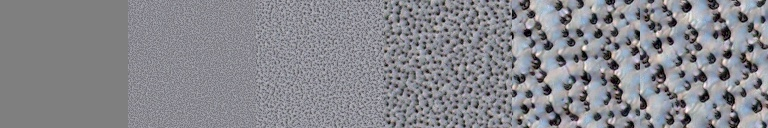

In [ ]:
#@title e) Influence des couches selectionnées (Premières couches)
cnn2 = models.vgg16(pretrained=True).features.to(device).eval()
cnn2.requires_grad_(False)
# select chosen layers
layers = [1]  
# Define weights for layers
layers_weights = [1e6/n**2 for n in [64]]
# Initialize outputs dic
outputs = {}

# Register hook on each layer with index on array "layers"
for layer in layers:
    handle = cnn2[layer].register_forward_hook(save_output(layer))

ca = CA() 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False)
print()
vis_ca_static(ca, img_sz=128)

step_n: 3991  loss: 68.13003540039062  additional loss: None  lr: 0.0003
[0,          10,          20,          50,          1000,          5000]


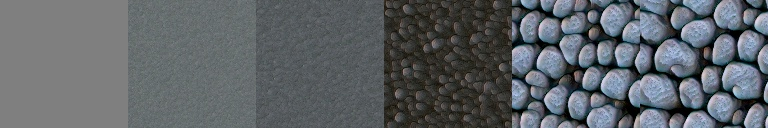

In [ ]:
#@title e) Influence des couches selectionnées (Dernières couches)
cnn3 = models.vgg16(pretrained=True).features.to(device).eval()
cnn3.requires_grad_(False)
# select chosen layers
layers = [25]  
# Define weights for layers
layers_weights = [1e6/n**2 for n in [512]]
# Initialize outputs dic
outputs = {}

# Register hook on each layer with index on array "layers"
for layer in layers:
    handle = cnn3[layer].register_forward_hook(save_output(layer))

ca = CA() 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False)
print()
vis_ca_static(ca, img_sz=128)

Dans les exemples ci-dessous, nous n'avons sélectionné que la première et dernière couche, respectivement, pour la fonction de perte. Nous observons les rôles complémentaires qu'ont chaque couche dans la production d'un résultat final convaincant. La première semble capter la texture générale de la couleur des galets tandis que la dernière semble se concentrer sur la forme des galets.

La combinaison de ces différents régimes permet d'obtenir des résultats convaincants lorsque toutes les couches sont prises en compte.

## III - **Contributions**


### 1) <ins>Rotations des noyaux<ins>


Une fois l'automate cellulaire entraîné, il est possible de modifier les gradients et laplacien qui contrôlent l'information que reçoit chaque cellule par ses voisins. Il est par exemple possible d'appliquer une rotation aux gradients à travers la formule suivante :

$$\begin{bmatrix} g_x \\ g_y \end{bmatrix} = \begin{bmatrix}  cos(\alpha_{x,y}) & sin(α_{x,y}) \\ - sin(α_{x,y}) & cos(\alpha_{x,y}) \end{bmatrix} \begin{bmatrix} K_x * \mathbf{s} \\  K_y * \mathbf{s} \end{bmatrix}$$

Ici, l'angle de rotation $\alpha_{x,y}$ peut dépendre de la position du pixel, ce qui nécessite d'appliquer à chaque voisinage un filtre différentiel différent. Nous avons implémenté cette fonction dans l'automate cellulaire en partie 2 et l'essayons ici :

* dans un cas statique ($\alpha$ ne dépend pas de la position du pixel) ;
* dans un cas "dynamique" ($α$ dépend de la position) ;

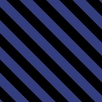

step_n: 3991  loss: 424.73187255859375  additional loss: None  lr: 0.0003

  0%|          | 0/300 [00:00<?, ?it/s]

In [ ]:
#@title Entraînement sur des lignes
target_img = import_img('lignes', sz=102)
ca = CA() 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102)
vis_ca(ca, img_sz=102)

Nous souhaitons appliquer ces rotations sur un automate cellulaire entraîné à générer des lignes.

In [ ]:
#@title Rotation statique
ca.rotation(0.75)
vis_ca(ca, img_sz=102)

  0%|          | 0/300 [00:00<?, ?it/s]

In [ ]:
#@title Rotation "dynamique"
# Génération des laplaciens auxquels une rotation a été appliquée.
rotated_kernels_x, rotated_kernels_y = rotation_kernels(102, 102)
ca.go_dynamic()
vis_ca(ca, img_sz=102, rand=True)

  0%|          | 0/300 [00:00<?, ?it/s]

Cette rotation dynamique nous permet d'atteindre des textures en rotation uniforme dans ce cas. Ce type de changement géométrique peut s'avérer utile pour donner une certaine "géométrie" aux textures générées par des automates cellulaires entraînés sur des textures plates.

### 2) <ins>Filtres de dérivation adaptatifs<ins>

Nous définissons dans la partie suivant un automate cellulaire adaptatif (`AdaptativeCA`), au sens où les filtres de dérivation sont laissés en paramètres du modèle, et donc optimisés grâce aux paramètres d'entraînements. 

Nous considérons 3 régimes pour ces automates cellulaires adaptatifs :

* Dans le premier, seul 9 paramètres supplémentaire (modélisant $K_x$) sont ajoutés aux modèles. Nous retrouvons ensuite $K_y = K_x^T$ et $K_{lap} = \frac{1}{2} (K_x \star K_x)_{::2} + (K_y ⋆ K_y)_{::2}$, où chaque membre du terme de driote représente le produit de convolution de $K$ avec lui même, en ne gardant que les colonnes (ou lignes) paires. Cette formule permet d'obtenir la forme de $K_{lap}$ utilisé auparavant à partir des filtres de Sobel.

* Dans le deuxième, les trois filtres $K_x$, $K_y$ et $K_{lap}$ sont laissés en paramètres du modèle.

* Dans le troisième, nous laissons pour chaque canaux d'état trois filtres différents en paramètres.

Pour les deux premiers régimes, nous laissons la possibilité au modèle de commencer avec des paramètres aléatoires ou avec les filtres classiques utilisés auparavant.

In [ ]:
sobel_x = torch.tensor([[-1.0,0.0,1.0],[-2.0,0.0,2.0],[-1.0,0.0,1.0]], requires_grad = False)
sobel_y = sobel_x.T
lap = torch.tensor([[1.0,2.0,1.0],[2.0,-12,2.0],[1.0,2.0,1.0]], requires_grad = False)

class AdaptativeCA(torch.nn.Module):
  def __init__(self, mode='kernel_x', chn=12, init = 'rand', hidden_n=96):
    super().__init__()
    self.chn =  chn
    self.diff_weight = None
    self.diff_operator = None
    self.mode = mode
    self.init = init

    if self.mode=='kernel_x':
      if self.init=='rand':
        self.diff_weight = torch.nn.Parameter(torch.randn(1,1,3,3)) # Differential operator weights
      elif self.init=='regular':
        self.diff_weight = torch.nn.Parameter(sobel_x.unsqueeze(0).unsqueeze(0))
    if self.mode=='per_operation_kernel':
      
      self.diff_operator = torch.nn.Conv2d(1, 3, 3, bias=False) # 1 output channel for each operation
      if self.init=='regular':
        with torch.no_grad():
           self.diff_operator.weight = torch.nn.Parameter(torch.cat([
                  sobel_x.unsqueeze(0).unsqueeze(0),
                  sobel_y.unsqueeze(0).unsqueeze(0),
                  lap.unsqueeze(0).unsqueeze(0)], dim=0))

    if self.mode=='per_channel_kernel':
      self.diff_operator = torch.nn.Conv2d(chn, 3*chn, 3, bias=False) # one dynamic per channel
    
    # Conv because has to apply to all cells
    self.w1 = torch.nn.Conv2d(chn*4, hidden_n, 1)
    self.w2 = torch.nn.Conv2d(hidden_n, chn, 1, bias=False)
    self.w2.weight.data.zero_()
    self.theta=None
    self.dynamic=False

  def rotation(self, theta):
    self.theta = theta

  def go_dynamic(self, bool_=True):
    self.dynamic=bool_

  def forward(self, x, update_rate=0.5):
    y = torch.nn.functional.pad(x, [1, 1, 1, 1], 'circular')
    b, ch, h, w = y.shape

    if self.mode == 'per_channel_kernel':
      y = self.diff_operator(y)  
    elif self.mode == 'per_operation_kernel':
      y = y.reshape(b*ch, 1, h, w) # We reshape so that we apply the same convolution to all channels (for a given 3x3 matrix)
      y = self.diff_operator(y).reshape(b, -1, h-2, w-2) #convolution
    elif self.mode == 'kernel_x':
      y = y.reshape(b*ch, 1, h, w) # We reshape so that we apply the same convolution to all channels (for a given 3x3 matrix)
      y_x = torch.nn.functional.conv2d(y, self.diff_weight, bias=None).reshape(b, -1, h-2, w-2)
      y_y = torch.nn.functional.conv2d(y, self.diff_weight.transpose(2,3), bias=None).reshape(b, -1, h-2, w-2) # sobel_y = sobel_x.T
      y_lap = torch.nn.functional.conv2d(y, self.get_lap_kernel(), bias=None).reshape(b, -1, h-2, w-2) # see above formula
      y = torch.cat([y_x, y_y, y_lap], dim =1)

    y = torch.cat([x, y], dim =1)
    y = self.w1(y)
    y = torch.relu(y)
    y = self.w2(y)
    b, c, h, w = y.shape
    udpate_mask = (torch.rand(b, 1, h, w)+update_rate).floor() # Which cells are updated or not
    return x+y*udpate_mask
    
  def get_lap_kernel(self):
    '''
    Computes laplacian kernel from sobel.
    '''
    lap_kernel = torch.nn.functional.conv2d(torch.nn.functional.pad(
        self.diff_weight, [2, 2, 2, 2],
         mode = 'constant',
          value=0.0),
          self.diff_weight,  padding=0)
    lap_kernel += torch.nn.functional.conv2d(torch.nn.functional.pad(
        self.diff_weight.transpose(2,3), [2, 2, 2, 2],
         mode = 'constant',
          value=0.0), self.diff_weight.transpose(2,3),  padding=0)
    lap_kernel = lap_kernel[:,:,:, [0,2,4]]
    lap_kernel = lap_kernel[:,:,[0,2,4], :]
    return lap_kernel/2

  def seed(self, n, sz=128):
    return torch.zeros(n, self.chn, sz, sz)


Dans les cellules suivantes, nous observons le comportement du modèle d'automate cellulaire suivant le régime de filtre choisi.

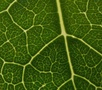

Init_params Parameter containing:
tensor([[[[ 1.1176,  0.0404,  0.5725],
          [-0.8673, -0.8566,  1.2235],
          [-0.8858,  0.1177,  0.9011]]]], requires_grad=True)
step_n: 1991  loss: 89.04226684570312  additional loss: None  lr: 0.001
[0,          10,          20,          50,          1000,          5000]


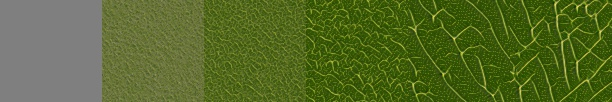

In [ ]:
#@title a) Premier régime, initialisation aléatoire
target_img = import_img('feuille', sz=102)
ca = AdaptativeCA(mode='kernel_x', init='rand') 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)
print('Init_params', ca.diff_weight)
# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False, epochs=2000)
print()
vis_ca_static(ca, img_sz=102)

In [ ]:
ca.diff_weight

Parameter containing:
tensor([[[[ 1.1226,  0.1325,  0.5411],
          [-1.0104, -0.8867,  1.1381],
          [-1.0497,  0.0568,  0.7047]]]], requires_grad=True)

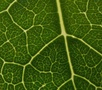

step_n: 1991  loss: 59.455589294433594  additional loss: None  lr: 0.001
[0,          10,          20,          50,          1000,          5000]


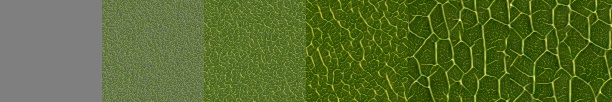

In [ ]:
#@title b) Premier régime, initialisation déterministe
ca = AdaptativeCA(mode='kernel_x', init='regular') 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False, epochs=2000)
print()
vis_ca_static(ca, img_sz=102)

In [ ]:
ca.diff_weight

Parameter containing:
tensor([[[[-0.9598,  0.0098,  0.9844],
          [-1.9626,  0.0035,  1.9565],
          [-1.0079,  0.0225,  0.9183]]]], requires_grad=True)

step_n: 1991  loss: 61.46208190917969  additional loss: None  lr: 0.001
[0,          10,          20,          50,          1000,          5000]


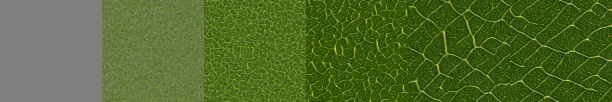

In [ ]:
#@title b) Deuxième régime, initialisation déterministe

ca = AdaptativeCA(mode='per_operation_kernel', init='regular') 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False, epochs=2000)
print()
vis_ca_static(ca, img_sz=102)

In [ ]:
print(ca.diff_operator.weight)

Parameter containing:
tensor([[[[ -0.9412,   0.0160,   0.9825],
          [ -1.9271,   0.0210,   1.9685],
          [ -1.0055,   0.0485,   0.9117]]],


        [[[ -0.9448,  -1.9300,  -0.9989],
          [  0.0423,   0.0221,   0.0349],
          [  1.0050,   1.9659,   0.9068]]],


        [[[  0.9382,   1.9254,   0.9329],
          [  1.9347, -12.0237,   1.9345],
          [  0.9535,   1.9511,   0.9529]]]], requires_grad=True)


Init kernels Parameter containing:
tensor([[[[-0.1584,  0.1022,  0.3059],
          [ 0.2771,  0.2763,  0.2783],
          [-0.1167, -0.1984, -0.2638]]],


        [[[-0.1412,  0.0761,  0.2737],
          [-0.2920,  0.3005,  0.0940],
          [-0.3213, -0.1086, -0.0649]]],


        [[[ 0.0655,  0.0329, -0.3138],
          [-0.2043,  0.2973,  0.1171],
          [-0.2692,  0.1832, -0.1399]]]], requires_grad=True)
step_n: 1991  loss: 104.04306030273438  additional loss: None  lr: 0.001
[0,          10,          20,          50,          1000,          5000]


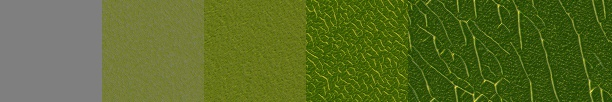

In [ ]:
#@title d) Deuxième régime, initialisation aléatoire
ca = AdaptativeCA(mode='per_operation_kernel', init='rand') 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)
print('Init kernels', ca.diff_operator.weight)
# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False, epochs=2000)
print()
vis_ca_static(ca, img_sz=102)

In [ ]:
print('Init kernels', ca.diff_operator.weight)

Init kernels Parameter containing:
tensor([[[[-0.2609,  0.0181,  0.2301],
          [ 0.2262,  0.3384,  0.2738],
          [-0.1449, -0.2644, -0.3811]]],


        [[[-0.2316,  0.1093,  0.3310],
          [-0.3948,  0.3054,  0.1588],
          [-0.3214, -0.1870, -0.0677]]],


        [[[ 0.0874, -0.0511, -0.3209],
          [-0.1646,  0.2987,  0.1649],
          [-0.2688,  0.1734, -0.0822]]]], requires_grad=True)


step_n: 1991  loss: 125.96688079833984  additional loss: None  lr: 0.001
[0,          10,          20,          50,          1000,          5000]


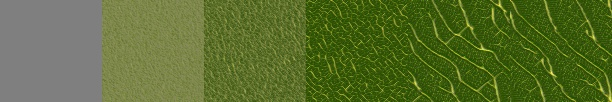

In [ ]:
#@title e) Troisième régime

ca = AdaptativeCA(mode='per_channel_kernel', init='rand') 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False, epochs=2000)
print()
vis_ca_static(ca, img_sz=102)

**Observations** : Sur cette image en particulier, le régime le plus convaincant (et atteignant la loss la plus faible au cours de l'entraînement) est le premier régime, avec une initialisation déterministe. Il semble de plus que l'initialisation déterministe, qu'il s'agisse du premier ou deuxième régime, est crucial pour obtenir des bonnes performances. En partant des filtre classique, les noyaux semblent très peu s'éloigner de ceux-ci lors de l'entraînement. Cela indiquerait que l'approche par équation différentielle classique des dynamiques cellulaires est robuste, et très efficace.

De manière opposé, les filtres aléatoires sont moins stables dans les deux cas et donnent de moins bonnes synthèses de texture. Nous observons lors de l'entraînement que la varabilité des filtres a un impact fort sur la variabilité de la loss. Il semble difficile d'apprendre les paramètres d'une équation différentielle à la géométrie changeante. Les textures générées sont pour autant plutôt proche de la texture initiale. Nous observons plus bas que dans le cas de texture à objets clairement identiables ("des bulles"), l'approche par filtre aléatoire est totalement inefficace, ce qui suggèrerait que les automates cellualaires classiques sont particulièrement bien adaptés pour traiter des textures à structures locales indépendantes.

Enfin, considérer une "géométrie" différentes pour chaque canal d'état semble ajouter trop de variabilité pour obtenir des résultats concluants.

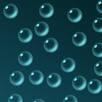

Init_params Parameter containing:
tensor([[[[-0.3197, -0.9269, -0.4182],
          [-0.0182, -1.3109,  0.7695],
          [-0.7464, -1.1833,  0.5648]]]], requires_grad=True)
step_n: 3991  loss: 1778.1942138671875  additional loss: None  lr: 0.0003
[0,          10,          20,          50,          1000,          5000]


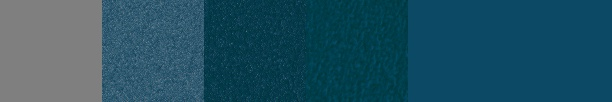

In [ ]:
#@title f) Synthèse de bulle (premier régime, paramètre aléatoire)
target_img = import_img('bulles', sz=102)
ca = AdaptativeCA(mode='kernel_x', init='rand') 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)
print('Init_params', ca.diff_weight)
# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False, epochs=4000)
print()
vis_ca_static(ca, img_sz=102)

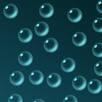

Init_params Parameter containing:
tensor([[[[-1.,  0.,  1.],
          [-2.,  0.,  2.],
          [-1.,  0.,  1.]]]], requires_grad=True)
step_n: 3991  loss: 122.31243896484375  additional loss: None  lr: 0.0003
[0,          10,          20,          50,          1000,          5000]


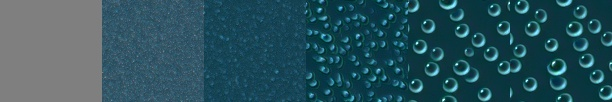

In [ ]:
#@title g) Synthès de bulles (premier régime, initialisation déterministe)
target_img = import_img('bulles', sz=102)
ca = AdaptativeCA(mode='kernel_x', init='regular') 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)
print('Init_params', ca.diff_weight)
# Entraînement
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False, epochs=4000)
print()
vis_ca_static(ca, img_sz=102)

### 3) <ins>Essais avec différentes loss<ins>

Nous souhaitons considérer des régularisations de la loss présentée en introduction. Nous considérons en particulier deux régularisations qui nous semblent intéressantes : 

* **Correction de couleur**

On peut observer sur certaine texture que les couleurs des textures générées par automates cellulaires sont légèrement différentes de celles de la texture initiale (voir l'exemple des galets). Nous souhaiton résoudre ce problème avec une régularisation sur la couleur prenant la forme d'une régularisation sur le moyenne des couleurs et sur la matrice de covariance de celles-ci : 

  $$
  m = \begin{pmatrix}
  m_r \\
  m_g \\
  m_b
  \end{pmatrix}
  = \frac{1}{MN}\sum_{t\in\Omega} h(t) \in \mathbb{R}^{3}
  $$
  $$
  C_h = \frac{1}{MN}\sum_{t\in\Omega} 
  \begin{pmatrix}
  h_r(t) - m_r \\
  h_g(t) - m_g \\
  h_b(t) - m_b
  \end{pmatrix}
  \begin{pmatrix}
  h_r(t) - m_r \\
  h_g(t) - m_g \\
  h_b(t) - m_b
  \end{pmatrix}^T
  \in\mathbb{R}^{3\times 3}.
  $$

 Et nous changeons $ \mathcal{L}$ en :
  $ \mathcal{L} + \lambda_{moy} \| m(x) - m(u)\|^2 + \lambda_{cov} \| C(x) - C(u)\|^2. $

* **Correction spectrale**

Nous avons vu en cours qu'une régularisation sur le module des transformées de Fourier de la texture cible et de la texture générée pouvait améliorer la structure de certaines textures possédant des périodicités marquées. Nous ajoutons donc dans ce cas à $\mathcal{L}$ la régularisation suivante :

$$\lambda_{Fourier} \| |\hat{x}| - |\hat{u}|\|^2.$$



##### a) Régularisation sur la couleur

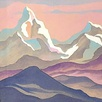

step_n: 3991  loss: 51.060035705566406  additional loss: None  lr: 0.0003
[0,          10,          20,          50,          1000,          5000]


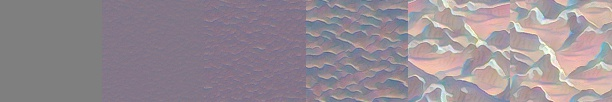

In [ ]:
#@title Loss classique
target_img = import_img('gouache', sz=102)
ca = CA() 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)
train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False)
print()
vis_ca_static(ca, img_sz=102)



step_n: 3991  loss: 78.41664123535156  additional loss: 9.385515213012695  lr: 0.0003
[0,          10,          20,          50,          1000,          5000]


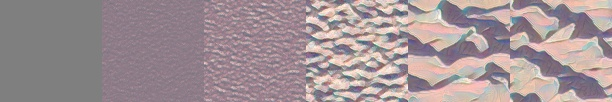

In [ ]:
#@title Loss régularisée
train(ca, target_img, opt, lr_sched, mode='color_reg', pool_size=256, img_sz=102, display=False, lbda_mean =3e3, lbda_cov=3e3)
print()
vis_ca_static(ca, img_sz=102)

Il apparaît qu'une loss normale a des difficultés à capturer les couelurs sombre de l'image, qui représente tout de même une partie non négligeable de celle-ci. Ces parties sont plus facilement capturées lorsque l'on considère une régularisation sur la couleur. Nous perdons cependant la texture globale des montagnes. Un plus long entraînement ou un meilleure tuning de la loss pourrait donner une image plus adaptée.

##### b) Régularisation sur la transformée de Fourier

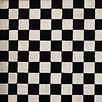

step_n: 3991  loss: 2181.205322265625  lr: 0.0003

  0%|          | 0/300 [00:00<?, ?it/s]

In [ ]:
#@title Loss classique
target_img = import_img('damier', sz=102)
ca = CA() 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

train(ca, target_img, opt, lr_sched, pool_size=256, img_sz=102, display=False)
vis_ca(ca, img_sz=102)


Avec une loss classique, les carreaux de l'images semblent peu stables, ont des tailles différentes et ne sont pas alternés. Il est difficile de retrouver la structure de damier après 10000 étapes environ.

In [ ]:
#@title Loss régularisée
ca = CA() 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)

train(ca, target_img, opt, lr_sched, mode='fourier', pool_size=256, img_sz=102, display=False, lbda_fourier = 1.)
vis_ca(ca, img_sz=102)

step_n: 3991  loss: 49612.49609375  additional loss: 46838.7109375  lr: 0.0003

  0%|          | 0/300 [00:00<?, ?it/s]

On atteint une image de damier beaucoup plus convaincante à la fin de 10000 étapes, en omettant quelques ondulations disparaissantes. Cette loss sur le module de la transformée de Fourier permet bien de conserver les périodicités, de l'image et facilite donc la génération d'une texture de damier.


### 4) <ins>Texture inpainting<ins>

Dans cette partie, on s'intéresse à un problème d'"inpainting" de texture. Il s'agit de completer de façon cohérente la partie d'une image de texture qui a été masquée tout en conservant le reste de l'image.

Partons tout d'abord d'une image de texture dont on masque la partie centrale. On entraine ensuite notre modèle NCA sur celle-ci comme précemment à la différence que la partie masquée n'est pas prise en compte dans la loss afin de ne pas interférer dans la texture apprise.

In [ ]:
#@title VGG16-based Style Model
vgg16 = models.vgg16(pretrained=True).features

def calc_styles(imgs):
  style_layers = [1, 6, 11, 18, 25]  
  mean = torch.tensor([0.485, 0.456, 0.406])[:,None,None]
  std = torch.tensor([0.229, 0.224, 0.225])[:,None,None]
  x = (imgs-mean) / std
  grams = []
  for i, layer in enumerate(vgg16[:max(style_layers)+1]):
    x = layer(x)
    if i in style_layers:
      h, w = x.shape[-2:]
      y = x.clone()  # workaround for pytorch in-place modification bug(?)
      gram = torch.einsum('bchw, bdhw -> bcd', y, y) / (h*w)
      grams.append(gram)
  return grams

def style_loss(grams_x, grams_y):
  loss = 0.0
  for x, y in zip(grams_x, grams_y):
    loss = loss + (x-y).square().mean()
  return loss

def to_nchw(img):
  img = torch.as_tensor(img)
  if len(img.shape) == 3:
    img = img[None,...]
  return img.permute(0, 3, 1, 2)

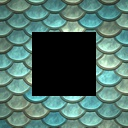

In [ ]:
#@title Target image {vertical-output: true}
leng = 128
style_path = "nacre.png"
style_img = imread(style_path, max_size=leng)[:,:,:3]

# url = dic_images['visage']
# style_img = imread(url, max_size=128)

marg = leng // 4
style_img[marg:leng-marg,marg:leng-marg] = 0

with torch.no_grad():
  target_style = calc_styles(to_nchw(style_img))
imshow(style_img)

In [ ]:
#@title setup training
ca = CA(chn=12) 
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)
loss_log = []
with torch.no_grad():
  pool = ca.seed(256, sz=leng)

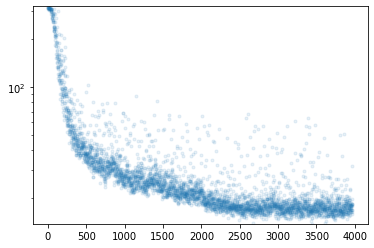

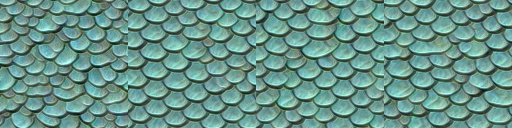

step_n: 3991  loss: 18.041688919067383  lr: 0.0003

In [ ]:
# @title training loop {vertical-output: true}
for i in range(4000):
  with torch.no_grad():
    batch_idx = np.random.choice(len(pool), 4, replace=False)
    x = pool[batch_idx]
    if i%8 == 0:
      x[:1] = ca.seed(1, sz=leng)

  step_n = np.random.randint(32, 96)
  x = torch.utils.checkpoint.checkpoint_sequential([ca]*step_n, 16, x)
  imgs = to_rgb(x)

  imgs[...,marg:leng-marg,marg:leng-marg] = 0
  
  styles = calc_styles(imgs)
  overflow_loss = (x-x.clamp(-1.0, 1.0)).abs().sum()
  loss = style_loss(styles, target_style)+overflow_loss
  with torch.no_grad():
    loss.backward()
    for p in ca.parameters():
      p.grad /= (p.grad.norm()+1e-8)   # normalize gradients 
    opt.step()
    opt.zero_grad()
    lr_sched.step()
    pool[batch_idx] = x                # update pool
    
    loss_log.append(loss.item())
    if i%64==0:
      clear_output(True)
      plt.plot(loss_log, '.', alpha=0.1)
      plt.yscale('log')
      plt.ylim(np.min(loss_log), loss_log[0])
      plt.show()
      imgs = to_rgb(x).permute([0, 2, 3, 1]).cpu()
      imshow(np.hstack(imgs))
    if i%10 == 0:
      print('\rstep_n:', len(loss_log),
        ' loss:', loss.item(), 
        ' lr:', lr_sched.get_lr()[0], end='')


Une idée pour ensuite regénerer la partie masquée est d'itérer notre automate cellulaire uniquement sur la partie masquée. Se pose donc la question de l'initilisation de la partie non-masquée qui va agir comme une condition aux limites de notre équation de diffusion. Comme nous souhaitons une reconsitution cohérente avec le reste de l'image, on fixe les canaux RGB égaux à la partie non-masquée. Pour les canaux restants, on les fixe comme précédemment à une valeur grise moyenne.

Cette dernière valeur n'est pas optimale puique cette valeur moyenne impose une contrainte sur les canaux restants qui n'est pas forcément cohérente avec la texture qui doit être générée sur la partie masquée. Bien que l'intérieur de la partie masquée soit convenablement reconstruite, on observe une nette séparation entre les 2 parties.

In [ ]:
#@title Initialisation naïve des canaux sous-jacents{vertical-output: true}
with VideoWriter() as vid, torch.no_grad():
  x = ca.seed(1, leng)
  x[:,:3] = (to_nchw(style_img)-.5)

  for k in tnrange(3000, leave=False):
    x[...,marg:leng-marg,marg:leng-marg] = ca(x)[...,marg:leng-marg,marg:leng-marg]
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

  0%|          | 0/3000 [00:00<?, ?it/s]

Une manière de voir la sous-optimalité dans ces conditions aux limites est d'observer ce qui se passe quand la partie non-masquée est fixée à partir de valeur issues d'une génération sur l'ensemble de l'image. On aimerait atteindre le même niveau de cohérence mais en conservant notre partie non-masquée.

In [ ]:
#@title La cohérence aux limites que l'on peut espérer {vertical-output: true}
with VideoWriter() as vid, torch.no_grad():
  x = ca.seed(1, leng)
  for k in tnrange(3000, leave=False):
    x = ca(x)
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

  for k in tnrange(3000, leave=False):
    x[...,marg:leng-marg,marg:leng-marg] = ca(x)[...,marg:leng-marg,marg:leng-marg]
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Une manière donc d'améliorer notre condition au limite est d'appliquer dans un premier temps l'automate cellulaire sur toute l'image exceptée les canaux RGB de la partie non-masquée afin que les canaux restants "s'alignent" sur eux et définissent une bordure plus cohérente avec la partie masquée. Ensuite on itère l'automate cellulaire sur la partie non-masquée seulement comme précédemment.

In [ ]:
#@title Itération préalable des canaux sous-jacents {vertical-output: true}
with VideoWriter() as vid, torch.no_grad():
  x = ca.seed(1, leng)
  for k in tnrange(3000, leave=False):
    x = ca(x)
    x_tamp = torch.clone(x[:,:3,marg:leng-marg,marg:leng-marg])
    x[:,:3] = (to_nchw(style_img)-.5)
    x[:,:3,marg:leng-marg,marg:leng-marg] = x_tamp
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

  for k in tnrange(3000, leave=False):
    x[...,marg:leng-marg,marg:leng-marg] = ca(x)[...,marg:leng-marg,marg:leng-marg]
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Une dernière amélioration est faite en fixant progressivement les canaux de plus en plus proches de la bordure. Les conditions aux limites ne sont pas imposées brutalement.

In [ ]:
#@title Fixation progressive des canaux sous-jacents {vertical-output: true}
with VideoWriter() as vid, torch.no_grad():
  x = ca.seed(1, leng)
  margbis = 0
  for k in tnrange(3201, leave=False):
    x[...,margbis:leng-margbis,margbis:leng-margbis] = ca(x)[...,margbis:leng-margbis,margbis:leng-margbis]
    x_tamp = torch.clone(x[:,:3,margbis:leng-margbis,margbis:leng-margbis])
    x[:,:3] = (to_nchw(style_img)-.5)
    x[:,:3,margbis:leng-margbis,margbis:leng-margbis] = x_tamp
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))
    if k%100==0:
      margbis = min(margbis+1, marg)

  for k in tnrange(1800, leave=False):
    x[...,marg:leng-marg,marg:leng-marg] = ca(x)[...,marg:leng-marg,marg:leng-marg]
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

  0%|          | 0/3201 [00:00<?, ?it/s]

  0%|          | 0/1800 [00:00<?, ?it/s]

In [ ]:
#@title Fixation progressive des canaux sous-jacents {vertical-output: true}
with VideoWriter() as vid, torch.no_grad():
  x = ca.seed(1, leng)
  margbis = 0
  for k in tnrange(3201, leave=False):
    x[...,margbis:leng-margbis,margbis:leng-margbis] = ca(x)[...,margbis:leng-margbis,margbis:leng-margbis]
    x_tamp = torch.clone(x[:,:3,margbis:leng-margbis,margbis:leng-margbis])
    x[:,:3] = (to_nchw(style_img)-.5)
    x[:,:3,margbis:leng-margbis,margbis:leng-margbis] = x_tamp
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))
    if k%100==0:
      margbis = min(margbis+1, marg)

  for k in tnrange(1800, leave=False):
    x[...,marg:leng-marg,marg:leng-marg] = ca(x)[...,marg:leng-marg,marg:leng-marg]
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

  0%|          | 0/3201 [00:00<?, ?it/s]

  0%|          | 0/1800 [00:00<?, ?it/s]

In [ ]:
#@title Fixation progressive des canaux sous-jacents{vertical-output: true}
with VideoWriter() as vid, torch.no_grad():
  x = ca.seed(1, leng)
  margbis = 0
  for k in tnrange(3201, leave=False):
    x[...,margbis:leng-margbis,margbis:leng-margbis] = ca(x)[...,margbis:leng-margbis,margbis:leng-margbis]
    x_tamp = torch.clone(x[:,:3,margbis:leng-margbis,margbis:leng-margbis])
    x[:,:3] = (to_nchw(style_img)-.5)
    x[:,:3,margbis:leng-margbis,margbis:leng-margbis] = x_tamp
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))
    if k%100==0:
      margbis = min(margbis+1, marg)

  for k in tnrange(1800, leave=False):
    x[...,marg:leng-marg,marg:leng-marg] = ca(x)[...,marg:leng-marg,marg:leng-marg]
    if k%10==0:
      img = to_rgb(x[0]).permute(1, 2, 0).cpu()
      vid.add(zoom(img, 2))

  0%|          | 0/3201 [00:00<?, ?it/s]

  0%|          | 0/1800 [00:00<?, ?it/s]

### 5) <ins>Visualisation de features<ins>
Une manière de visualiser le comportement d'un réseau de neurones préalablement entrainé est d'observer quel 
type d'entrée optimise un certain comportement dans ses couches profondes.
Cette optimisation est d'autant plus simple que les réseaux de neurones sont facilement différentiables par rapport à leur entrée.
Il suffit pour cela de détacher les paramètres appris du DAG de différentiation automatique et d'y ajouter des paramètres comme entrée.

In [ ]:
n_inceptions = 1
for name, param in ca.named_parameters():
    param.requires_grad_(False)
ca.inception_params = torch.nn.Parameter(torch.zeros(n_inceptions, 12, 256, 256), requires_grad=True)
for name, param in ca.named_parameters():
    print(name, param.requires_grad)

loss_log = []
opt = torch.optim.Adam(ca.parameters(), 1e-3)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(opt, [2000], 0.3)
criterion = torch.nn.MSELoss()

inception_params True
w1.weight False
w1.bias False
w2.weight False


On s'intéresse dans la suite à 2 fonctions objectif différentes. 

La première consiste à minimiser la loss de style après 32 itérations de NCA. 
Bien entendu, puisque le réseau a été préalablement entrainé sur une texture cible, n'importe quelle entrée devrait converger,
 après un nombre d'itérations de NCA suffisamment grand, 
vers une texture similaire à la cible et donc atteindre une faible loss de style. L'interêt de ne considérer que 32 itérations est donc de pousser l'optimisation 
vers une entrée capable de converger très rapidement vers la texture cible.

Sans grande surprise, on observe après optimisation que l'entrée optimale admet certaines ressemblances avec la texture cible.

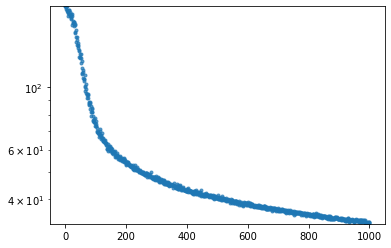

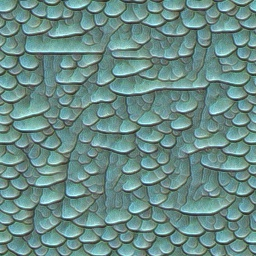

step_n: 1001  loss: 33.19047546386719  lr: 0.001

In [ ]:
#@title style loss input minimization {vertical-output: true}
for i in range(1001):
    opt.zero_grad()
    x = ca.inception_params
    x = torch.utils.checkpoint.checkpoint_sequential([ca]*32, 2, x)
    imgs = to_rgb(x)
    styles = calc_styles(imgs)
    loss = style_loss(styles, target_style)
    loss.backward()
    opt.step()
    lr_sched.step()

    loss_log.append(loss.item())
    if i%20==0:
        clear_output(True)
        plt.plot(loss_log, '.', alpha=0.7)
        plt.yscale('log')
        plt.ylim(np.min(loss_log), loss_log[0])
        plt.show()
        imgs = to_rgb(x.detach()).permute([0, 2, 3, 1]).cpu()
        imshow(np.hstack(imgs))
        print('\rstep_n:', len(loss_log),
        ' loss:', loss.item(), 
        ' lr:', lr_sched.get_lr()[0], end='')


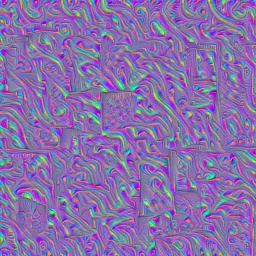

step_n: 1001  loss: 29.171396255493164  lr: 0.001

In [ ]:
#@title style loss input minimization {vertical-output: true}
for i in range(1001):
    opt.zero_grad()
    x = ca.inception_params
    x = torch.utils.checkpoint.checkpoint_sequential([ca]*32, 2, x)
    imgs = to_rgb(x)
    styles = calc_styles(imgs)
    loss = style_loss(styles, target_style)
    loss.backward()
    opt.step()
    lr_sched.step()

    loss_log.append(loss.item())
    if i%20==0:
        clear_output(True)
        imgs = to_rgb(x.detach()).permute([0, 2, 3, 1]).cpu()
        imshow(np.hstack(imgs))
        print('\rstep_n:', len(loss_log),
        ' loss:', loss.item(), 
        ' lr:', lr_sched.get_lr()[0], end='')


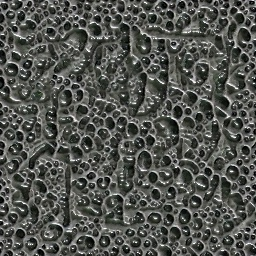

step_n: 2002  loss: 16.43669319152832  lr: 0.0003

In [ ]:
#@title style loss input minimization {vertical-output: true}
for i in range(1001):
    opt.zero_grad()
    x = ca.inception_params
    x = torch.utils.checkpoint.checkpoint_sequential([ca]*32, 2, x)
    imgs = to_rgb(x)
    styles = calc_styles(imgs)
    loss = style_loss(styles, target_style)
    loss.backward()
    opt.step()
    lr_sched.step()

    loss_log.append(loss.item())
    if i%20==0:
        clear_output(True)
        imgs = to_rgb(x.detach()).permute([0, 2, 3, 1]).cpu()
        imshow(np.hstack(imgs))
        print('\rstep_n:', len(loss_log),
        ' loss:', loss.item(), 
        ' lr:', lr_sched.get_lr()[0], end='')


Notre deuxième objectif consiste à maximiser l'énergie de la dernière couche de notre NCA après 32 itérations.
C'est un type d'objectif que l'on retrouve dans un réseau d'inception.

Plus surprenamment, l'entrée maximisant la réponse de cette couche profonde possède également certaines ressemblances avec la texture cible.

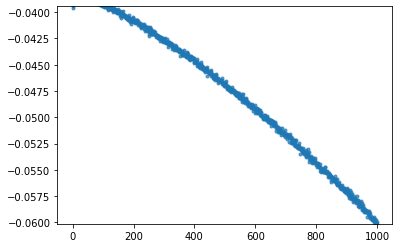

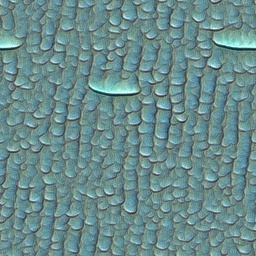

step_n: 1001  loss: -0.060128044337034225  lr: 0.001

In [ ]:
#@title  layer energy input maximization {vertical-output: true}
for i in range(1001):
    opt.zero_grad()
    x = ca.inception_params
    x = torch.utils.checkpoint.checkpoint_sequential([ca]*32, 2, x)
    loss = -criterion(x, torch.zeros_like(x))
    loss.backward()
    opt.step()
    lr_sched.step()

    loss_log.append(loss.item())
    if i%20==0:
        clear_output(True)
        plt.plot(loss_log, '.', alpha=0.7)
        plt.ylim(np.min(loss_log), loss_log[0])
        plt.show()
        imgs = to_rgb(x.detach()).permute([0, 2, 3, 1]).cpu()
        imshow(np.hstack(imgs))
        print('\rstep_n:', len(loss_log),
        ' loss:', loss.item(), 
        ' lr:', lr_sched.get_lr()[0], end='')


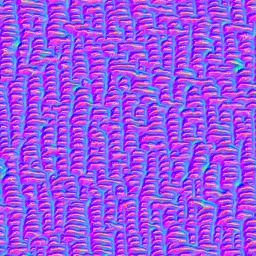

step_n: 1001  loss: -0.08749254792928696  lr: 0.001

In [ ]:
#@title  layer energy input maximization {vertical-output: true}
for i in range(1001):
    opt.zero_grad()
    x = ca.inception_params
    x = torch.utils.checkpoint.checkpoint_sequential([ca]*32, 2, x)
    loss = -criterion(x, torch.zeros_like(x))
    loss.backward()
    opt.step()
    lr_sched.step()

    loss_log.append(loss.item())
    if i%20==0:
        clear_output(True)
        imgs = to_rgb(x.detach()).permute([0, 2, 3, 1]).cpu()
        imshow(np.hstack(imgs))
        print('\rstep_n:', len(loss_log),
        ' loss:', loss.item(), 
        ' lr:', lr_sched.get_lr()[0], end='')


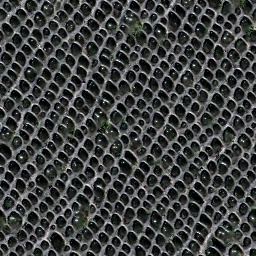

step_n: 1001  loss: -0.09040854871273041  lr: 0.001

In [ ]:
#@title  layer energy input maximization {vertical-output: true}
for i in range(1001):
    opt.zero_grad()
    x = ca.inception_params
    x = torch.utils.checkpoint.checkpoint_sequential([ca]*32, 2, x)
    loss = -criterion(x, torch.zeros_like(x))
    loss.backward()
    opt.step()
    lr_sched.step()

    loss_log.append(loss.item())
    if i%20==0:
        clear_output(True)
        imgs = to_rgb(x.detach()).permute([0, 2, 3, 1]).cpu()
        imshow(np.hstack(imgs))
        print('\rstep_n:', len(loss_log),
        ' loss:', loss.item(), 
        ' lr:', lr_sched.get_lr()[0], end='')


## IV - **Conclusion**

L'algorithme de NCA présente plusieurs avantages notables :
* C'est un methode très efficace en terme de calcul pour générer des textures locales : elle est facilement parallélisable et ne nécessite d'entraîner que peu de paramètres.
* Une fois entraîné, un automate cellulaire peut encore être modifier pour s'adpater à une géométrie.
* Comme pour d'autres méthode de texture, il est possible de régulariser la loss pour obtenir des textures respectant plus ou moins certaines propriétés voulues.
* L'approche par automate cellulaire est très convaincante pour capturer de manière efficace les interactions locales.

Au cours de notre projet, nous avons cependant identifier les inconvénients suivant : 

* Pour faire de l'inpainting, il est nécessaire de trouver des conditions aux limites cohérentes, ce qui peut s'avérer très compliqué.

* Le modèle par NCA est local. Il ne peut donc pas reproduire des textures ayant des dépendances plus globales (comme des visages).

Enfin, étant donné l'efficacité des NCA, nous pensons qu'il serait intéressant de connaître plus précisément la forme et les propriétés de l'espace de solution approché par le modèle.

## **Références**

**[1]** A. Mordvintsev, E. Niklasson, and E. Randazzo, “Texture generation with neural cellular automata,” 2021.

**[2]** L. A. Gatys, A. S. Ecker, and M. Bethge, “Texture synthesis using convolutional neural networks,” 2015.